# Breast Cancer Diagnostic
## The goal of this project is to build a model able to predict the diagnosis of breast cancer tissues as malignant or benign. 

- Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image. 

- Class distribution: 357 benign, 212 malignant. More info about this dataset here

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import (roc_auc_score, confusion_matrix, recall_score, precision_score, RocCurveDisplay, 
                             accuracy_score, plot_confusion_matrix, auc)
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
import plotly.express as px

In [2]:
# import data
cancer_tissues = pd.read_csv("https://raw.githubusercontent.com/emmanueliarussi/DataScienceCapstone/master/3_MidtermProjects/ProjectBCD/data/data.csv")
cancer_tissues.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
#shape
cancer_tissues.shape

(569, 33)

In [4]:
# data info to see nulls, types, col names
cancer_tissues.info()

# mean, se, worst same parameters but different measures

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [5]:
#drop null and id
cancer_tissues.drop(['Unnamed: 32','id'], axis=1, inplace=True)
le = LabelEncoder()
le.fit(cancer_tissues['diagnosis'])
cancer_tissues['diagnosis01']=le.transform(cancer_tissues['diagnosis']) # M:1, B:0
#cancer_tissues
X=cancer_tissues.drop(['diagnosis', 'diagnosis01'], axis=1)
y=cancer_tissues['diagnosis01']

#standardScaler=StandardScaler()????????????????
#balance malignant and benign???

In [6]:
#export csv
X.to_csv('X.csv', index=False)
y.to_csv('y.csv', index=False)

In [7]:
cancer_tissues.groupby('diagnosis').mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis01
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442,0
M,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530,1


In [8]:
#what scaler should be used?
columns=list(cancer_tissues.columns)
for col in columns:
    print(col, ": ")
    print(cancer_tissues[col].unique())
    print()

diagnosis : 
['M' 'B']

radius_mean : 
[17.99  20.57  19.69  11.42  20.29  12.45  18.25  13.71  13.    12.46
 16.02  15.78  19.17  15.85  13.73  14.54  14.68  16.13  19.81  13.54
 13.08   9.504 15.34  21.16  16.65  17.14  14.58  18.61  15.3   17.57
 18.63  11.84  17.02  19.27  16.74  14.25  13.03  14.99  13.48  13.44
 10.95  19.07  13.28  13.17  18.65   8.196 12.05  13.49  11.76  13.64
 11.94  18.22  15.1   11.52  19.21  14.71  13.05   8.618 10.17   8.598
  9.173 12.68  14.78   9.465 11.31   9.029 12.78  18.94   8.888 17.2
 13.8   12.31  16.07  13.53  18.05  20.18  12.86  11.45  13.34  25.22
 19.1   12.    18.46  14.48  19.02  12.36  14.64  14.62  15.37  13.27
 13.45  15.06  20.26  12.18   9.787 11.6   14.42  13.61   6.981  9.876
 10.49  13.11  11.64  22.27  11.34   9.777 12.63  14.26  10.51   8.726
 11.93   8.95  14.87  17.95  11.41  18.66  24.25  14.5   13.37  13.85
 19.    19.79  12.19  15.46  16.16  15.71  18.45  12.77  11.71  11.43
 14.95  11.28   9.738 16.11  12.9   10.75  11.9  

 140.1   47.92]

area_mean : 
[1001.  1326.  1203.   386.1 1297.   477.1 1040.   577.9  519.8  475.9
  797.8  781.  1123.   782.7  578.3  658.8  684.5  798.8 1260.   566.3
  520.   273.9  704.4 1404.   904.6  912.7  644.8 1094.   732.4  955.1
 1088.   440.6  899.3 1162.   807.2  869.5  633.   523.8  698.8  559.2
  563.   371.1 1104.   545.2  531.5 1076.   201.9  534.6  449.3  561.
  427.9  571.8  437.6 1033.   712.8  409.  1152.   656.9  527.2  224.5
  311.9  221.8  645.7  260.9  499.   668.3  269.4  394.1  250.5  502.5
 1130.   244.   929.4  584.1  470.9  817.7 1006.  1245.   506.3  401.5
 1878.  1132.   443.3 1075.   648.2  466.1  651.9  662.7  728.2  551.7
  555.1  705.6 1264.   451.1  294.5  412.6  642.5  582.7  143.5  458.7
  298.3  336.1  530.2  412.5  466.7 1509.   396.5  290.2  480.4  629.9
  334.2  230.9  438.6  245.2  682.5  782.6  982.   403.3 1077.  1761.
  640.7  553.5  588.7  572.6 1138.   674.5 1192.   455.8  748.9  809.8
  761.7  423.6  399.8  678.1  384.8  288.5  813. 

[0.1189  0.08902 0.08758 0.173   0.07678 0.1244  0.08368 0.1151  0.1072
 0.2075  0.08452 0.1048  0.1023  0.06287 0.1431  0.1341  0.08216 0.1142
 0.07615 0.07259 0.08183 0.07773 0.09946 0.07526 0.09564 0.1059  0.1275
 0.07421 0.09876 0.07919 0.09782 0.1402  0.08482 0.1123  0.1233  0.08633
 0.1014  0.06169 0.05504 0.1071  0.07146 0.09606 0.1038  0.1027  0.09618
 0.09185 0.07409 0.1179  0.08301 0.06917 0.06563 0.08025 0.07408 0.07987
 0.07873 0.07036 0.08294 0.1094  0.06289 0.09026 0.0802  0.07712 0.1132
 0.0849  0.1031  0.08911 0.09211 0.06641 0.1175  0.0641  0.06589 0.1084
 0.1339  0.103   0.07609 0.06387 0.07191 0.1108  0.09964 0.07918 0.08851
 0.1016  0.1051  0.09203 0.07924 0.08579 0.06846 0.09288 0.09261 0.08473
 0.07246 0.06828 0.06206 0.06603 0.08234 0.07376 0.08988 0.08756 0.09353
 0.07397 0.09382 0.06878 0.07552 0.1405  0.09097 0.07185 0.09789 0.08832
 0.08468 0.08486 0.1082  0.1017  0.08541 0.07722 0.1065  0.1252  0.06111
 0.08523 0.08456 0.08009 0.08006 0.07628 0.07182 0.079  

In [9]:
cancer_tissues.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis01
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.372583
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,0.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [10]:
corr=cancer_tissues.corr()
corr
# check Multicollinearity
#radius, perimeter, area (mean, se, worst)
#compactness, concavity, concave points (mean, se, worst)
# compactness & fractal_dimension_se (se, worst)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis01
radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,0.730029
texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,0.415185
perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,0.742636
area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,0.708984
smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,0.358560
compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,0.596534
concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,0.696360
concave points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,0.776614
symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,0.330499
fractal_dimension_mean,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297,-0.012838


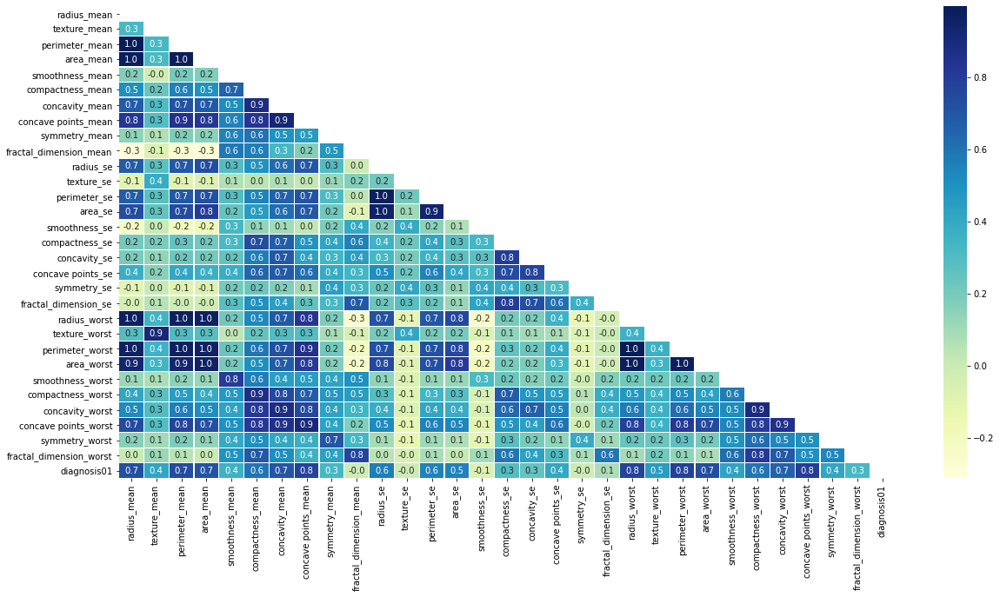

In [11]:
plt.figure(figsize=(20,10))
sns.heatmap(corr,linewidths=.1,cmap="YlGnBu", annot=True, fmt= '.1f', mask=np.triu(corr))
plt.yticks(rotation=0);

In [12]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              569 non-null    float64
 1   texture_mean             569 non-null    float64
 2   perimeter_mean           569 non-null    float64
 3   area_mean                569 non-null    float64
 4   smoothness_mean          569 non-null    float64
 5   compactness_mean         569 non-null    float64
 6   concavity_mean           569 non-null    float64
 7   concave points_mean      569 non-null    float64
 8   symmetry_mean            569 non-null    float64
 9   fractal_dimension_mean   569 non-null    float64
 10  radius_se                569 non-null    float64
 11  texture_se               569 non-null    float64
 12  perimeter_se             569 non-null    float64
 13  area_se                  569 non-null    float64
 14  smoothness_se            5

In [13]:
# transformer = RobustScaler().fit(X)
# transformer.transform(X)

In [14]:
cov=cancer_tissues.cov()
cov
#how much error can be explained

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis01
radius_mean,12.418920,4.907582,85.447142,1224.483409,0.008454,0.094197,0.190128,0.112475,0.014273,-7.753706e-03,...,6.433100,114.288570,1888.227223,0.009625,0.229249,0.387386,0.172393,0.035746,0.000450,1.244954
texture_mean,4.907582,18.498909,34.439759,485.993787,-0.001415,0.053767,0.103692,0.048977,0.008419,-2.321158e-03,...,24.110148,51.745933,841.283832,0.007611,0.188010,0.270110,0.083491,0.027942,0.009260,0.864145
perimeter_mean,85.447142,34.439759,590.440480,8435.772345,0.070836,0.714714,1.387234,0.802360,0.121922,-4.485888e-02,...,45.258113,792.328208,13026.148359,0.083526,1.742478,2.858506,1.231848,0.284300,0.022391,8.732438
area_mean,1224.483409,485.993787,8435.772345,123843.554318,0.876178,9.264931,19.244924,11.241958,1.459596,-7.034264e-01,...,621.824934,11341.789807,192192.557633,0.992514,21.616602,37.634415,16.701789,3.125809,0.023756,120.738222
smoothness_mean,0.008454,-0.001415,0.070836,0.876178,0.000198,0.000490,0.000585,0.000302,0.000215,5.806859e-05,...,0.003118,0.112879,1.655299,0.000259,0.001045,0.001276,0.000465,0.000343,0.000127,0.002440
compactness_mean,0.094197,0.053767,0.714714,9.264931,0.000490,0.002789,0.003718,0.001703,0.000873,2.108131e-04,...,0.080544,1.047413,15.323436,0.000682,0.007194,0.008994,0.002831,0.001667,0.000656,0.015246
concavity_mean,0.190128,0.103692,1.387234,19.244924,0.000585,0.003718,0.006355,0.002850,0.001094,1.895588e-04,...,0.146934,1.954350,30.682405,0.000817,0.009469,0.014704,0.004513,0.002020,0.000741,0.026864
concave points_mean,0.112475,0.048977,0.802360,11.241958,0.000302,0.001703,0.002850,0.001506,0.000492,4.572905e-05,...,0.069819,1.116016,17.886881,0.000401,0.004075,0.006091,0.002321,0.000902,0.000258,0.014583
symmetry_mean,0.014273,0.008419,0.121922,1.459596,0.000215,0.000873,0.001094,0.000492,0.000752,9.289106e-05,...,0.015274,0.201896,2.765725,0.000267,0.002041,0.002481,0.000775,0.001187,0.000217,0.004384
fractal_dimension_mean,-0.007754,-0.002321,-0.044859,-0.703426,0.000058,0.000211,0.000190,0.000046,0.000093,4.984872e-05,...,-0.002225,-0.048671,-0.932024,0.000081,0.000510,0.000510,0.000081,0.000146,0.000098,-0.000044


In [15]:
(cancer_tissues.groupby('diagnosis').size()/cancer_tissues['diagnosis'].count())*100

diagnosis
B    62.741652
M    37.258348
dtype: float64

Number of Benign:  357
Number of Malignant :  212


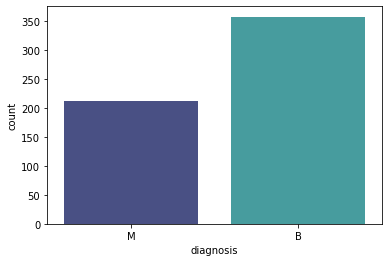

In [16]:
sns.color_palette("mako", as_cmap=True)
B, M = y.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)
sns.countplot(x=cancer_tissues['diagnosis'],label="Count", palette='mako');
#unbalanced data?
# see predictions, *****recall and specificity

In [17]:
fig = px.pie(cancer_tissues, names='diagnosis', title='Distribution of Diagnosis', color='diagnosis', color_discrete_map={'B':'lightblue','M':'lightgrey'})
fig.show()

In [18]:
#dropped anything with .86 or more
xMean=X.iloc[:,0:10].copy()#.drop(["radius_mean", "area_mean", "concavity_mean", "compactness_mean"], axis=1)
xSE=X.iloc[:,10:20].copy()#.drop(["perimeter_se", "area_se", "concavity_se", "compactness_se"], axis=1)
xWorst=X.iloc[:,20:30].copy()#.drop(["perimeter_worst", "area_worst", "concavity_worst", "compactness_worst"], axis=1)

def corrGraph(x):  
    for column in x:
        fig = px.box(cancer_tissues, x='diagnosis', y=column, color="diagnosis")
        fig.show();

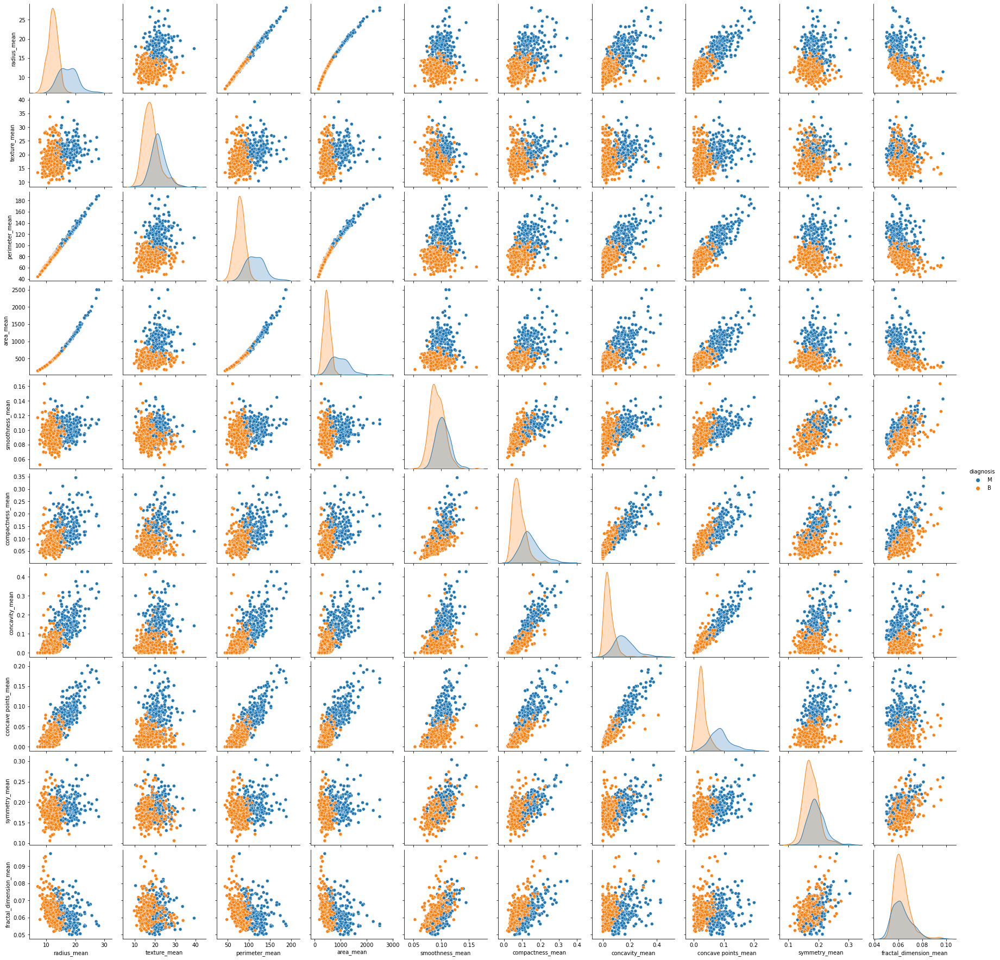

In [19]:
#xMean=X.iloc[:,0:10].copy().drop(["radius_mean", "area_mean", "concavity_mean", "compactness_mean"], axis=1)
xMeanY=xMean.copy()
xMeanY['diagnosis']=cancer_tissues['diagnosis']
g = sns.pairplot(xMeanY, hue='diagnosis');

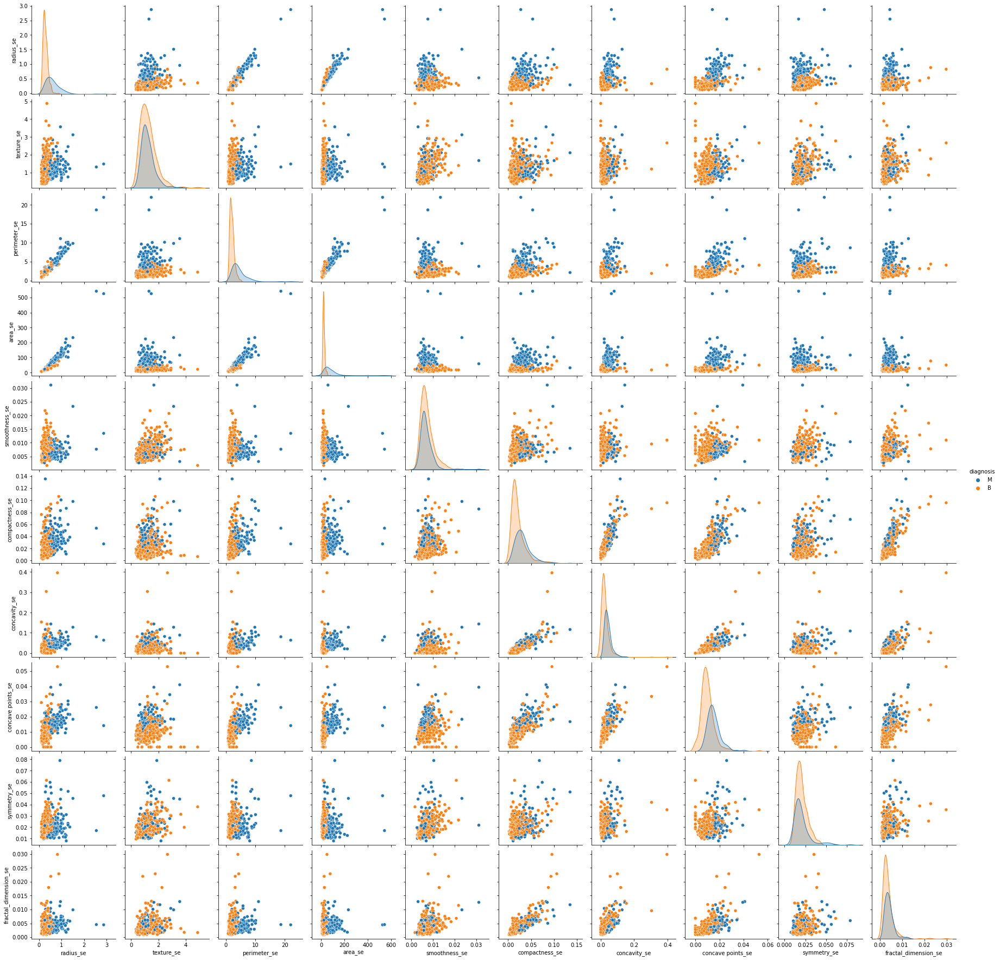

In [20]:
xSEY=xSE.copy()
xSEY['diagnosis']=cancer_tissues['diagnosis']
g = sns.pairplot(xSEY, hue='diagnosis');

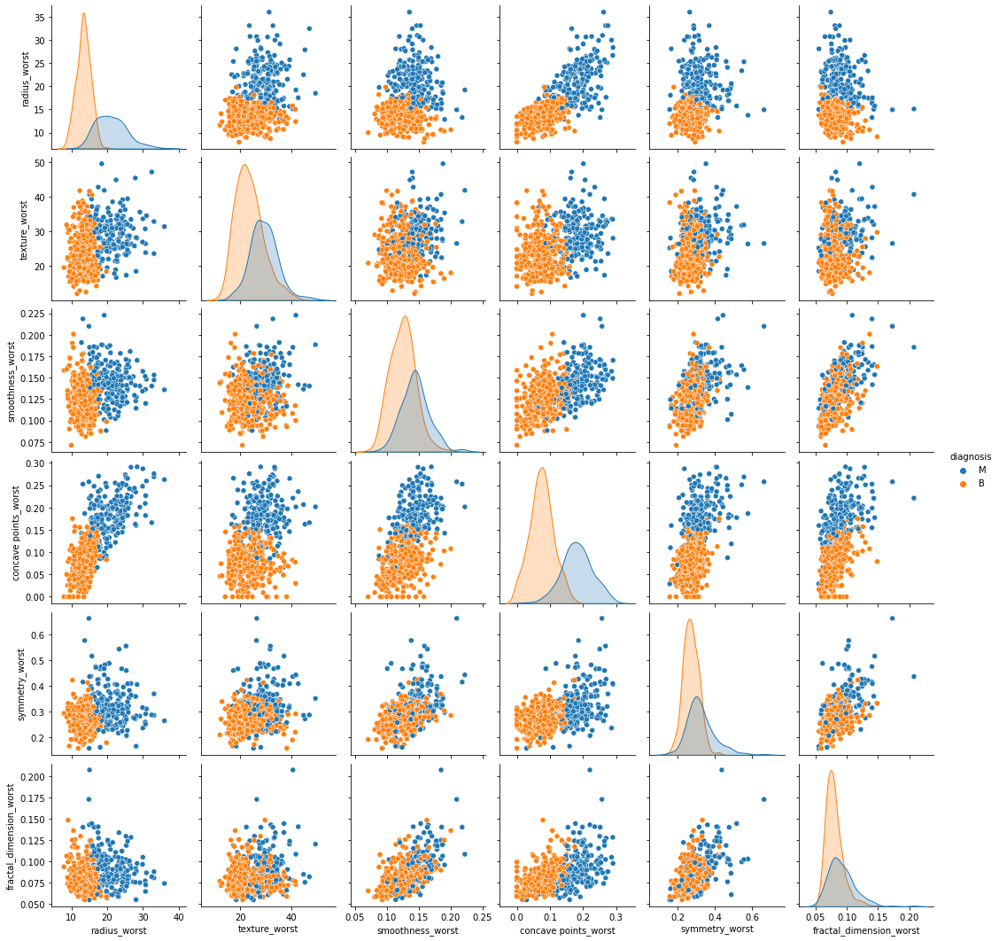

In [21]:
xWorst=X.iloc[:,20:30].copy().drop(["perimeter_worst", "area_worst", "concavity_worst", "compactness_worst"], axis=1)
xWorstY=xWorst.copy()
xWorstY['diagnosis']=cancer_tissues['diagnosis']
g = sns.pairplot(xWorstY, hue='diagnosis');

In [22]:
print(corrGraph(xMean))

None


In [23]:
print(corrGraph(xSE))

None


In [24]:
print(corrGraph(xWorst))

None


## Feature Importance 

### Decision Tree

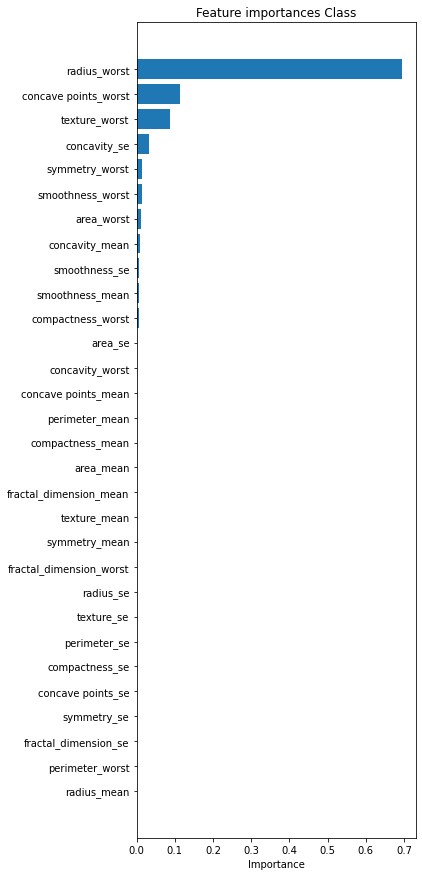

In [25]:
clf = DecisionTreeClassifier()
clf = clf.fit(X, y)
features_list = X.columns.values
feature_importance = clf.feature_importances_
sorted_idx = np.argsort(feature_importance)

plt.figure(figsize=(5,15))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), features_list[sorted_idx])
plt.xlabel('Importance')
plt.title('Feature importances Class')
plt.draw()
plt.show()

### Lasso

In [26]:
#LASSO
lr= LogisticRegression(C=100, solver='liblinear', penalty='l1', random_state=42, max_iter=5000)
lr = lr.fit(X, y)
param_grid={'solver': ['liblinear'], 
            'penalty':['l1'],
            'C':[100, 10, 1.0, 0.1, 0.01]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search= GridSearchCV(lr, param_grid, cv=cv, scoring='roc_auc')
grid_search.fit(X, y)
print(grid_search.best_estimator_)
grid_search.best_score_

LogisticRegression(C=100, max_iter=5000, penalty='l1', random_state=42,
                   solver='liblinear')


0.9930146132527085

In [27]:
#LASSO
lr= LogisticRegression(C=100, solver='liblinear', penalty='l1', random_state=42, max_iter=5000)
lr = lr.fit(X, y)
param_grid={'solver': ['liblinear'], 
            'penalty':['l1'],
            'C':[90,100,200]}

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search= GridSearchCV(lr, param_grid, cv=cv, scoring='roc_auc')
grid_search.fit(X, y)
print(grid_search.best_estimator_)
grid_search.best_score_

LogisticRegression(C=90, max_iter=5000, penalty='l1', random_state=42,
                   solver='liblinear')


0.9931893767608053

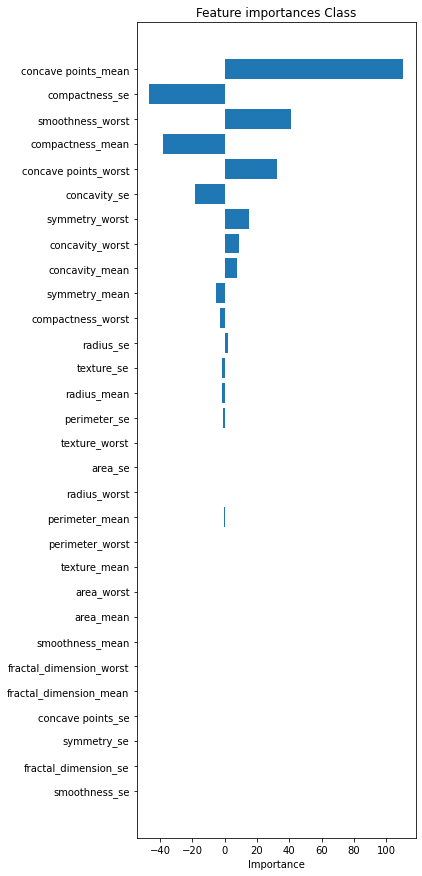

In [28]:
features_list = X.columns.values
feature_importance = lr.coef_.flatten()
#print(feature_importance)
sorted_idx = np.argsort(np.abs(feature_importance))
feature_importance[sorted_idx]

plt.figure(figsize=(5,15))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), features_list[sorted_idx])
plt.xlabel('Importance')
plt.title('Feature importances Class')
plt.draw()
plt.show()

In [29]:
impX=['radius_worst',
'concave points_worst',
'texture_worst',
'texture_mean',
'smoothness_worst',
'compactness_worst',
'area_worst',
'area_se',
'concavity_mean',
'smoothness_mean',
'concave points_mean',
'compactness_se',
'compactness_mean',
'concavity_se',
'symmetry_worst',
'concavity_worst',
'symmetry_mean',
'diagnosis'
]

print(corrGraph(impX))

None


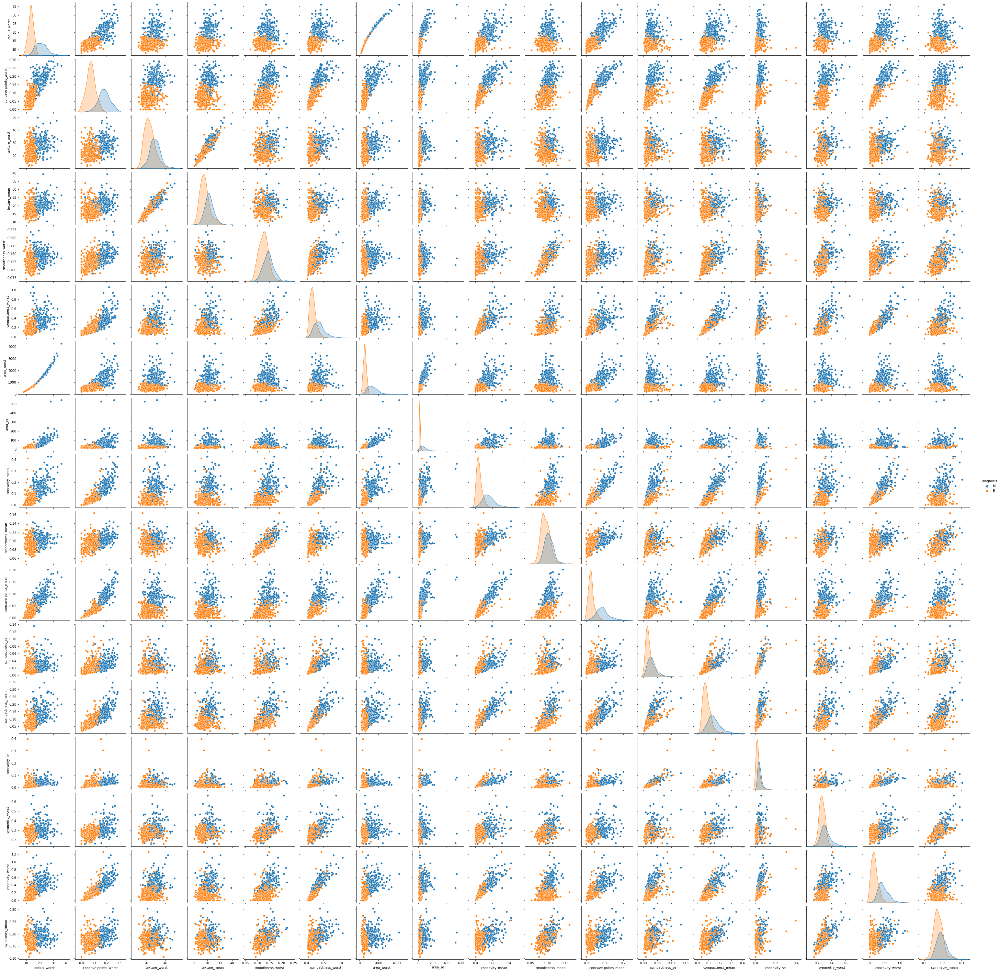

In [30]:
g = sns.pairplot(cancer_tissues[impX], hue='diagnosis');